<a href="https://colab.research.google.com/github/Abdullah-Elafifi/Optimizing-Adsorption-with-Ficus-Nitida-Charcoal/blob/main/Utilizing_Polynomial_Regression_and_XGBoost_for_Optimized_Lignocellulosic_Derivative_Adsorption_in_Water_Treatment_with_Ficus_Nitida_Activated_Charcoal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# *Utilizing Polynomial Regression and XGBoost for Optimized Lignocellulosic Derivative Adsorption in Water Treatment with Ficus Nitida Activated Charcoal*

In [ ]:
''''
Datasets:
1- https://www.kaggle.com/datasets/uom190346a/water-quality-and-potability/data (Author: Laksika Tharmalingam - Undergraduate Student)
2- https://www.kaggle.com/datasets/ulrikthygepedersen/co2-emissions-by-country/data (Collaborator: Ulrik Thyge Pedersen)
3- https://www.kaggle.com/datasets/patricklford/global-co-emissions/data (Author: Patrick Ford - Data Analyst, Specialising in data story telling)
4- https://www.kaggle.com/datasets/adityakadiwal/water-potability/data (Collaborator: Aditya Kadiwal)
5- https://github.com/MainakRepositor/Datasets (Author: MainakRepositor)

''''

In [ ]:
!pip install regressormetricgraphplot
!pip install pycountry

In [ ]:
# @title Importing libraries

import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import plotly.express as px
import seaborn as sns
import pandas as pd
import pycountry
import warnings
import pickle
import glob
from regressormetricgraphplot import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Activation, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder, PolynomialFeatures
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, mean_absolute_error
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, RandomForestRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC, LinearSVC, SVR
from keras.callbacks import ModelCheckpoint
from keras.models import Sequential
from keras.layers import Dense, Activation, Flatten
from xgboost import XGBClassifier, XGBRegressor

#warnings.filterwarnings('ignore')
#warnings.filterwarnings('ignore', category=DeprecationWarning)

In [ ]:
# @title Analysis the CO2 Emission all over the world based on Human activities, e.g., wood burning
emissions = pd.read_csv('GlobalCO2Emissions.csv')
percentage = pd.read_csv('co2_emissions_kt_by_country.csv')

In [ ]:
emissions.info(), percentage.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29 entries, 0 to 28
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Year       29 non-null     int64  
 1   Emissions  29 non-null     float64
dtypes: float64(1), int64(1)
memory usage: 592.0 bytes
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13953 entries, 0 to 13952
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   country_code  13953 non-null  object 
 1   country_name  13953 non-null  object 
 2   year          13953 non-null  int64  
 3   value         13953 non-null  float64
dtypes: float64(1), int64(1), object(2)
memory usage: 436.2+ KB


(None, None)

In [ ]:
emissions.head(), percentage.head()

(   Year  Emissions
 0  1750       0.03
 1  1760       0.03
 2  1770       0.03
 3  1780       0.03
 4  1790       0.04,
   country_code country_name  year      value
 0          ABW        Aruba  1960  11092.675
 1          ABW        Aruba  1961  11576.719
 2          ABW        Aruba  1962  12713.489
 3          ABW        Aruba  1963  12178.107
 4          ABW        Aruba  1964  11840.743)

In [ ]:
emissions.columns, percentage.columns

(Index(['Year', 'Emissions'], dtype='object'),
 Index(['country_code', 'country_name', 'year', 'value'], dtype='object'))

In [ ]:
emissions.shape, percentage.shape

((29, 2), (13953, 4))

In [ ]:
emissions.isnull().sum(), percentage.isnull().sum()

(Year         0
 Emissions    0
 dtype: int64,
 country_code    0
 country_name    0
 year            0
 value           0
 dtype: int64)

In [ ]:
emissions.describe()

,Year,Emissions
count,29.000000,29.000000
mean,1889.827586,5.937586
std,84.855368,11.443084
min,1750.000000,0.030000
25%,1820.000000,0.060000
50%,1890.000000,0.430000
75%,1960.000000,3.740000
max,2023.000000,40.900000


In [ ]:
# @title The trend and inflation rate of CO2 Emissions over the time

fig = px.scatter (emissions, x = "Year", y = "Emissions", marginal_y="violin", template = "plotly_dark",  trendline="lowess")

In [ ]:
fig.show()

In [ ]:
percentage.describe()

,year,value
count,13952.000000,1.395200e+04
mean,1990.733945,8.255575e+05
std,17.187123,2.789014e+06
min,1960.000000,0.000000e+00
25%,1976.000000,1.100000e+03
50%,1992.000000,1.391000e+04
75%,2006.000000,1.642835e+05
max,2019.000000,3.434401e+07


In [ ]:
#avg_value_by_country = percentage.groupby('country_name')['value'].mean().reset_index()

#fig = px.bar(avg_value_by_country, x='country_name', y='value',
             #title='Average Value by Country', labels={'value': 'Average Value', 'country_name': 'Country'})
#fig.show()

In [ ]:
country_codes = {country.name: country.alpha_3 for country in pycountry.countries}
percentage['iso_alpha'] = percentage['country_name'].map(country_codes)

fig = px.choropleth(percentage, locations='iso_alpha', color='value',
                     hover_name='country_name',
                     animation_frame='year',
                     title='Value Distribution by Country')
fig.show()

In [ ]:
percentage = percentage[percentage['value'] >= 0]

In [ ]:
percentage['value'].fillna(percentage['value'].mean(), inplace=True)

In [ ]:
fig = px.scatter(percentage, x='year', y='value', color='country_name',
                 title='Interactive Value Visualization',
                 labels={'value': 'Value', 'year': 'Year', 'country_name': 'Country'})
fig.update_traces(marker_size=15)

In [ ]:
# @title Loading the data of Water Potability, Turbidity, Carbon Adsorbtion, etc..

adsorp=pd.read_csv('Data.csv')
potability=pd.read_csv('water_potability.csv')

#adsorp['dataset'] = 'adsorp'
#potability['dataset'] = 'potability'

combineddf = pd.concat([adsorp, potability], ignore_index=True)

In [ ]:
combineddf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13276 entries, 0 to 13275
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Temperature      10000 non-null  float64
 1   MAC              10000 non-null  float64
 2   Absorption       10000 non-null  float64
 3   ph               2785 non-null   float64
 4   Hardness         3276 non-null   float64
 5   Solids           3276 non-null   float64
 6   Chloramines      3276 non-null   float64
 7   Sulfate          2495 non-null   float64
 8   Conductivity     3276 non-null   float64
 9   Organic_carbon   3276 non-null   float64
 10  Trihalomethanes  3114 non-null   float64
 11  Turbidity        3276 non-null   float64
 12  Potability       3276 non-null   float64
dtypes: float64(13)
memory usage: 1.3 MB


In [ ]:
combineddf.head()

,Temperature,MAC,Absorption,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,25.0,0.737138,73.218496,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100.0,0.669462,70.893968,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,50.0,0.653753,83.838606,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,25.0,0.653377,72.966910,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,75.0,0.824867,72.824045,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
potability.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [ ]:
missing_values = potability.isnull().sum()
missing_values

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [ ]:
missing_valuesad = adsorp.isnull().sum()
missing_valuesad

Temperature    0
MAC            0
Absorption     0
dtype: int64

In [ ]:
potability = potability.fillna(potability.mean())
potability = potability.dropna()

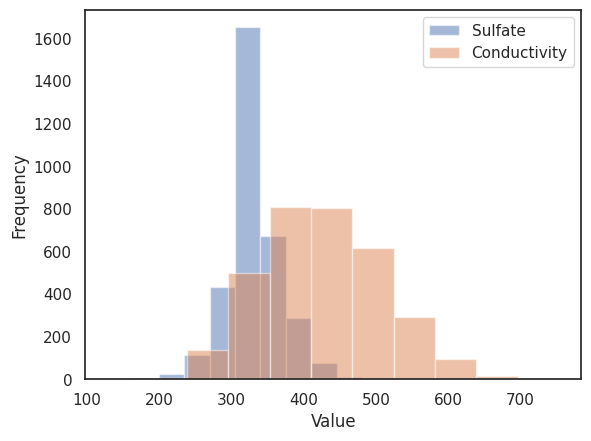

In [ ]:
plt.hist(potability['Sulfate'], alpha=0.5, label='Sulfate')
plt.hist(potability['Conductivity'], alpha=0.5, label='Conductivity')
plt.xlabel('Value')
plt.ylabel('Frequency')
_ = plt.legend()

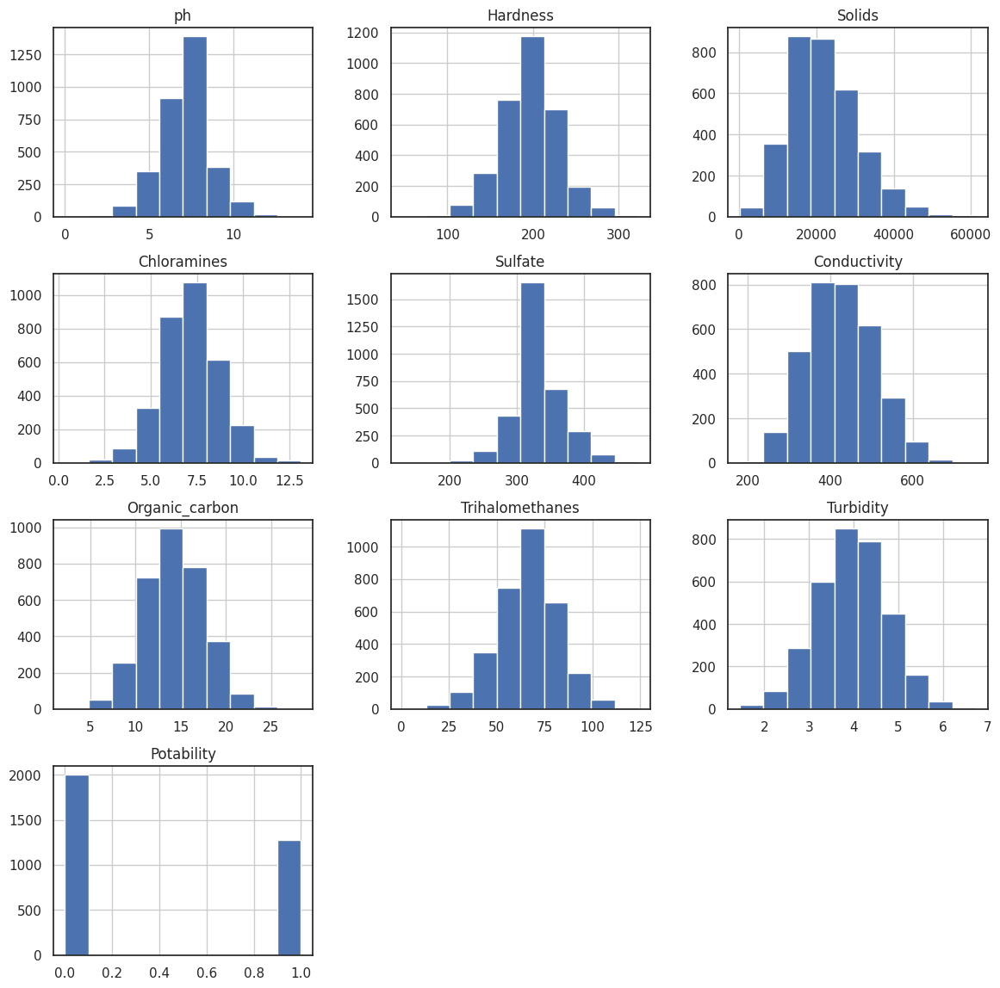

In [ ]:
potability.hist(figsize=(14,14))
plt.show()

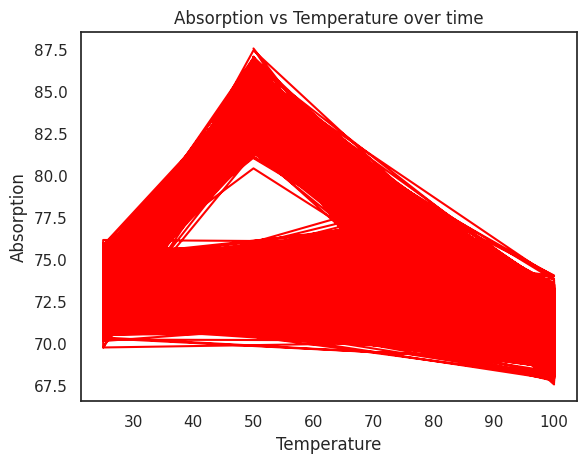

In [ ]:
# @title Absorption vs Temperature over time

plt.plot(adsorp['Temperature'], adsorp['Absorption'], color='red')
plt.xlabel('Temperature')
plt.ylabel('Absorption')
_ = plt.title('Absorption vs Temperature over time')

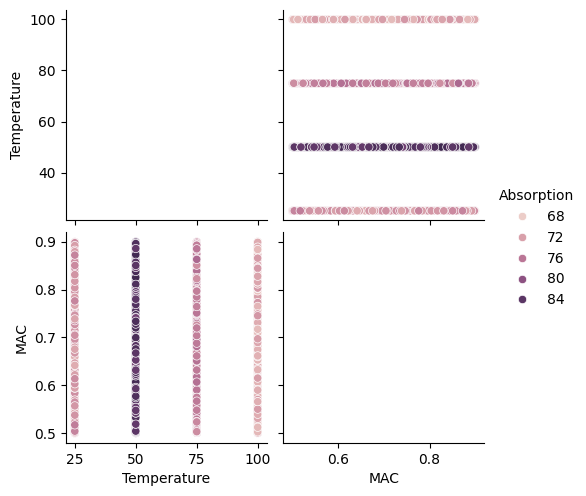

In [ ]:
sns.pairplot(adsorp, hue='Absorption')

<Axes: xlabel='Turbidity', ylabel='Organic_carbon'>

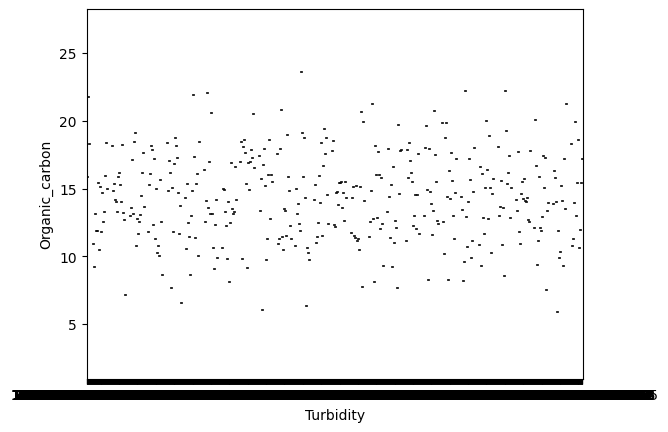

In [ ]:
sns.violinplot(x='Turbidity', y='Organic_carbon', data=potability, palette='rocket')

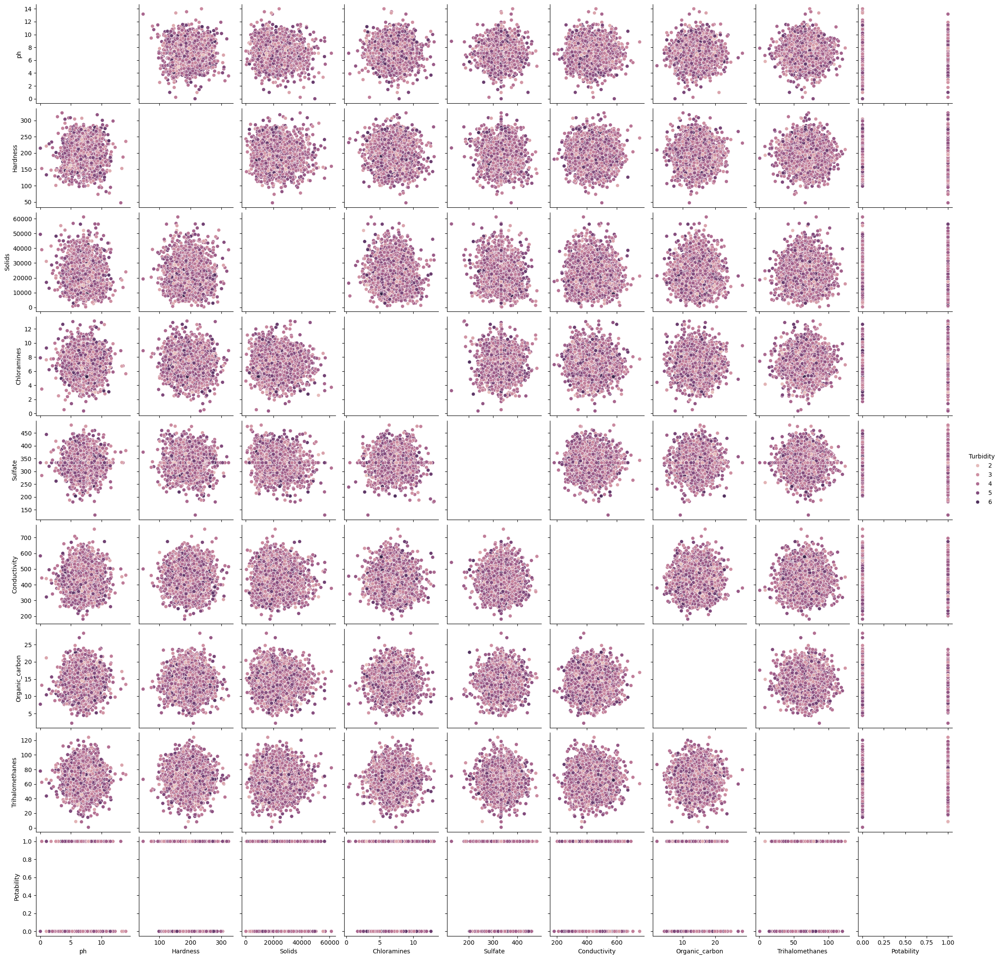

In [ ]:
sns.pairplot(potability, hue='Turbidity')

In [ ]:
print(potability['Potability'].value_counts())

Potability
0    1200
1     811
Name: count, dtype: int64


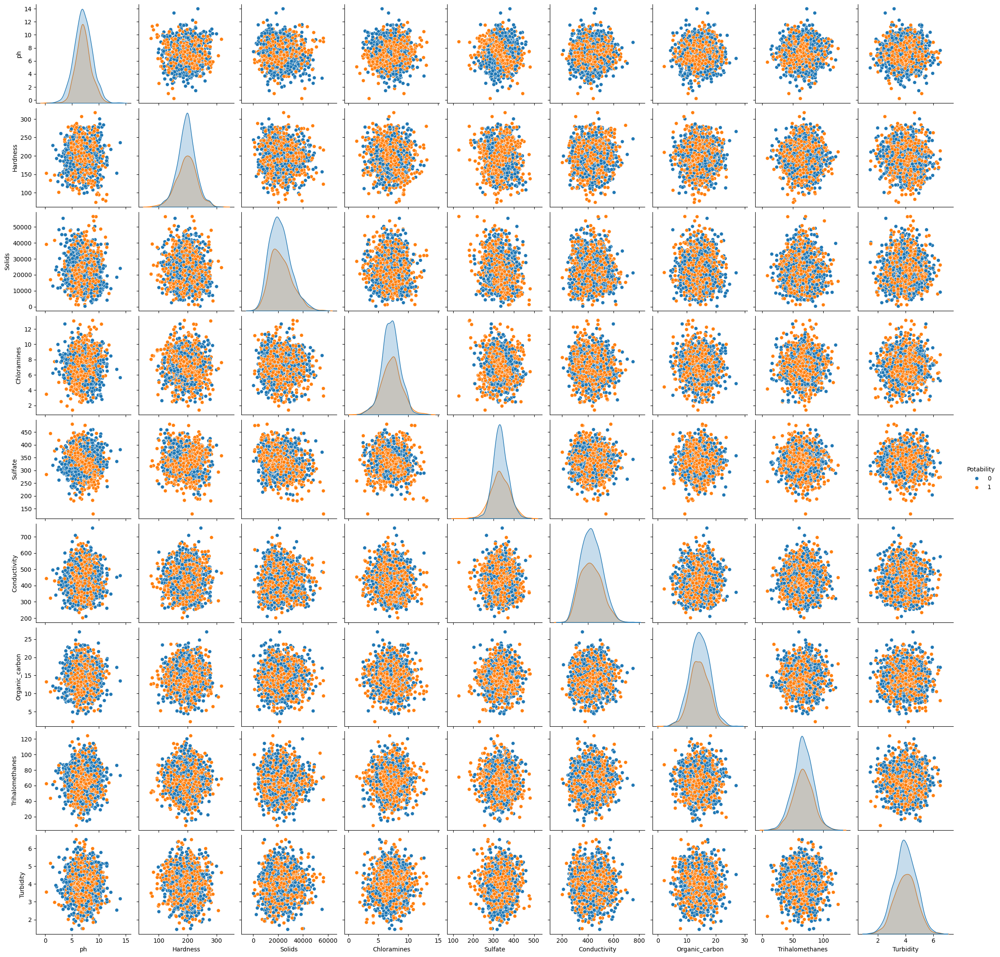

In [ ]:
sns.pairplot(potability,hue='Potability')

<Axes: >

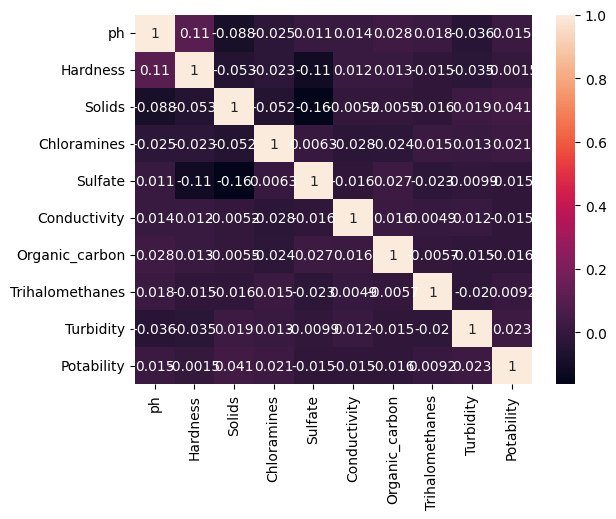

In [ ]:
sns.heatmap(potability.corr(), annot=True)

In [ ]:
results_df = pd.DataFrame(columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])

def cross_val(model):
    pred = cross_val_score(model, X, Y, cv=10)
    return pred.mean()

def print_evaluate(true, predicted):
    mae, mse, rmse, r2_square = evaluate(true, predicted)

    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('R2 Square', r2_square)
    print('__________________________________')

def evaluate(true, predicted):
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)

    return mae, mse, rmse, r2_square

In [ ]:
# @title The relation and Regression between Temperature, MAC, and Adsorption to predict Charcoal Capacity
X=adsorp[['MAC','Temperature']]
Y=adsorp['Absorption']
X, Y

(           MAC  Temperature
 0     0.737138           25
 1     0.669462          100
 2     0.653753           50
 3     0.653377           25
 4     0.824867           75
 ...        ...          ...
 9995  0.738813           25
 9996  0.548115           75
 9997  0.547581           50
 9998  0.872138           25
 9999  0.512317          100
 
 [10000 rows x 2 columns],
 0       73.218496
 1       70.893968
 2       83.838606
 3       72.966910
 4       72.824045
           ...    
 9995    71.704285
 9996    75.219311
 9997    83.386621
 9998    74.661673
 9999    69.696042
 Name: Absorption, Length: 10000, dtype: float64)

In [ ]:
train_X, val_X, train_y, val_y = train_test_split(X, Y, test_size = 0.25, random_state = 14)

In [ ]:
train_X, val_X, train_y, val_y

(           MAC  Temperature
 3998  0.686089           75
 4751  0.729337           25
 1490  0.673233           25
 9039  0.647354           25
 6978  0.515284          100
 ...        ...          ...
 7526  0.670650          100
 6471  0.729692           50
 2454  0.687853          100
 9484  0.665082          100
 2667  0.798827           50
 
 [7500 rows x 2 columns],
            MAC  Temperature
 5431  0.685255           50
 4771  0.565345          100
 1385  0.666235           25
 8091  0.803248          100
 9202  0.587376           75
 ...        ...          ...
 3614  0.718874          100
 1339  0.737440          100
 2377  0.804207          100
 5872  0.766871           50
 4314  0.773669           25
 
 [2500 rows x 2 columns],
 3998    75.295134
 4751    72.767017
 1490    71.605210
 9039    73.717605
 6978    70.934067
           ...    
 7526    71.989287
 6471    82.729661
 2454    70.993416
 9484    72.139279
 2667    86.769299
 Name: Absorption, Length: 7500, dtype:

In [ ]:
plot = CompareModels()

In [ ]:

results_df = pd.DataFrame(columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])


In [ ]:
model = RandomForestRegressor(n_estimators=1500)
model.fit(train_X,train_y)

predicted_absorption = model.predict(val_X)
trained_absorption = model.predict(train_X)

In [ ]:
print('Testing Metrics:')
print_evaluate(val_y, predicted_absorption)
print('Training:')
print_evaluate(train_y, trained_absorption)

results_df = pd.DataFrame(data=[["Random Forest Regressor", *evaluate(val_y, predicted_absorption) , cross_val(model)]],
                          columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])


Testing Metrics:
MAE: 0.9699426290300646
MSE: 1.4728377775483206
RMSE: 1.2136052807846218
R2 Square 0.94494086549716
__________________________________
Training:
MAE: 0.3615022637513
MSE: 0.2047062253698729
RMSE: 0.4524447207890406
R2 Square 0.9923677511956921
__________________________________


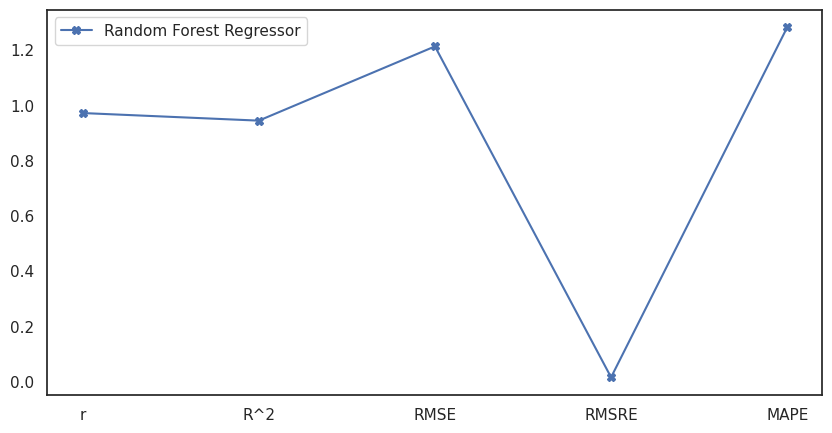

In [ ]:
plot.add(model_name='Random Forest Regressor', y_test=val_y, y_pred=predicted_absorption)
plot.show(figsize=(10, 5))

In [ ]:
XGBModel = XGBRegressor()
XGBModel.fit(train_X, train_y , verbose=False)

XGBpredictions = XGBModel.predict(val_X)
XGBtrained= XGBModel.predict(train_X)

In [ ]:
print('Testing Metrics:')
print_evaluate(val_y, XGBpredictions)
print('Training:')
print_evaluate(train_y, XGBtrained)

results_df2 = pd.DataFrame(data=[["XGB", *evaluate(val_y, XGBpredictions), cross_val(XGBModel)]],
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])

results_df = pd.concat([results_df, results_df2], ignore_index=True)

Testing Metrics:
MAE: 0.8412879848827394
MSE: 1.1059662461741306
RMSE: 1.0516492980904473
R2 Square 0.9586556338844964
__________________________________
Training:
MAE: 0.7517609998288756
MSE: 0.8888038297638063
RMSE: 0.942763931089754
R2 Square 0.9668619166089246
__________________________________


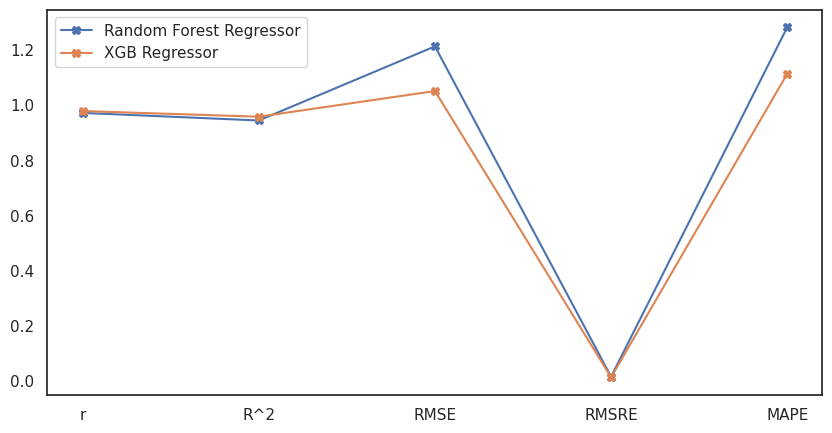

In [ ]:
plot.add(model_name='XGB Regressor', y_test=val_y, y_pred=XGBpredictions)
plot.show(figsize=(10, 5))

In [ ]:
X_train = np.array(train_X)
X_test = np.array(val_X)
y_train = np.array(train_y)
y_test = np.array(val_y)

model_NN = Sequential()

model_NN.add(Dense(X_train.shape[1], activation='relu'))
model_NN.add(Dense(32, activation='relu'))

model_NN.add(Dense(64, activation='relu'))

model_NN.add(Dense(128, activation='relu'))

model_NN.add(Dense(512, activation='relu'))
model_NN.add(Dropout(0.1))
model_NN.add(Dense(1))

model_NN.compile(optimizer=Adam(0.0002), loss='mse')

r = model_NN.fit(X_train, y_train,
              validation_data=(X_test,y_test),
              batch_size=5,
              epochs=20)

Epoch 1/20
1500/1500 [==============================] - 9s 5ms/step - loss: 1086.3850 - val_loss: 807.5867
Epoch 2/20
1500/1500 [==============================] - 8s 5ms/step - loss: 242.6844 - val_loss: 3.7806
Epoch 3/20
1500/1500 [==============================] - 7s 5ms/step - loss: 11.4055 - val_loss: 4.4240
Epoch 4/20
1500/1500 [==============================] - 8s 5ms/step - loss: 10.7807 - val_loss: 7.8082
Epoch 5/20
1500/1500 [==============================] - 7s 5ms/step - loss: 9.9883 - val_loss: 2.3232
Epoch 6/20
1500/1500 [==============================] - 8s 5ms/step - loss: 10.2917 - val_loss: 5.3122
Epoch 7/20
1500/1500 [==============================] - 7s 5ms/step - loss: 10.9625 - val_loss: 5.7536
Epoch 8/20
1500/1500 [==============================] - 8s 5ms/step - loss: 9.7355 - val_loss: 1.5487
Epoch 9/20
1500/1500 [==============================] - 8s 6ms/step - loss: 8.9523 - val_loss: 5.2785
Epoch 10/20
1500/1500 [==============================] - 7s 5ms/step - 

In [ ]:
test_pred = model_NN.predict(X_test)
train_pred = model_NN.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(val_y, test_pred)

print('Train set evaluation:\n_____________________________________')
print_evaluate(train_y, train_pred)

results_df2 = pd.DataFrame(data=[["ANN", *evaluate(val_y, test_pred), 0]],
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])
results_df = pd.concat([results_df, results_df2], ignore_index=True)

235/235 [==============================] - 1s 2ms/step
Test set evaluation:
_____________________________________
MAE: 1.1105884656655722
MSE: 1.864505094529906
RMSE: 1.3654688185857289
R2 Square 0.9302991555853242
__________________________________
Train set evaluation:
_____________________________________
MAE: 1.0899848857029044
MSE: 1.7865423256253867
RMSE: 1.3366159978188898
R2 Square 0.9333907139171617
__________________________________


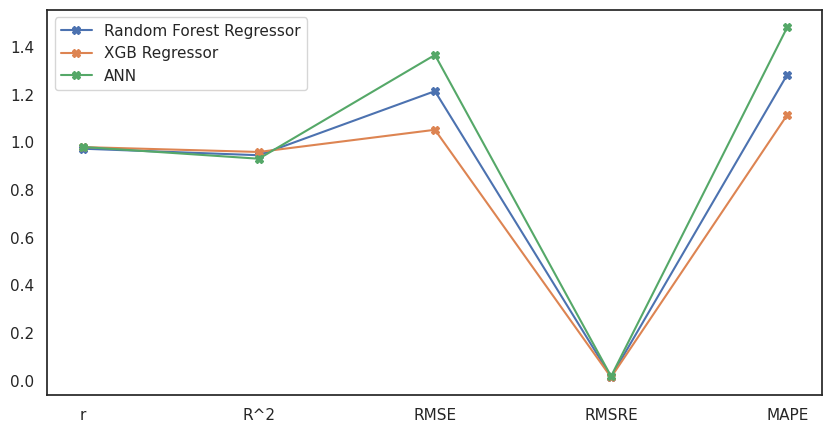

In [ ]:
if len(val_y.shape) > 1:
    val_y = val_y.ravel()
if len(test_pred.shape) > 1:
    test_pred = test_pred.ravel()

plot.add(model_name='ANN', y_test=val_y, y_pred=test_pred)
plot.show(figsize=(10, 5))

In [ ]:
poly_reg = PolynomialFeatures(degree=5)

X_train_2_d = poly_reg.fit_transform(train_X)
X_test_2_d = poly_reg.transform(val_X)

lin_reg = LinearRegression()
lin_reg.fit(X_train_2_d,train_y)

test_predsvr = lin_reg.predict(X_test_2_d)
train_predsvr = lin_reg.predict(X_train_2_d)

print('Test set evaluation:\n_____________________________________')
print_evaluate(val_y, test_predsvr)

print('Train set evaluation:\n_____________________________________')
print_evaluate(train_y, train_predsvr)


results_df2 = pd.DataFrame(data=[["Polynomial Regression", *evaluate(val_y, test_predsvr), 0]],
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])
results_df = pd.concat([results_df, results_df2], ignore_index=True)

Test set evaluation:
_____________________________________
MAE: 0.8101901368171525
MSE: 1.014090394338827
RMSE: 1.0070205530865928
R2 Square 0.9620902313404249
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.7987867361609191
MSE: 1.0019900602981513
RMSE: 1.0009945355985472
R2 Square 0.9626418911988571
__________________________________


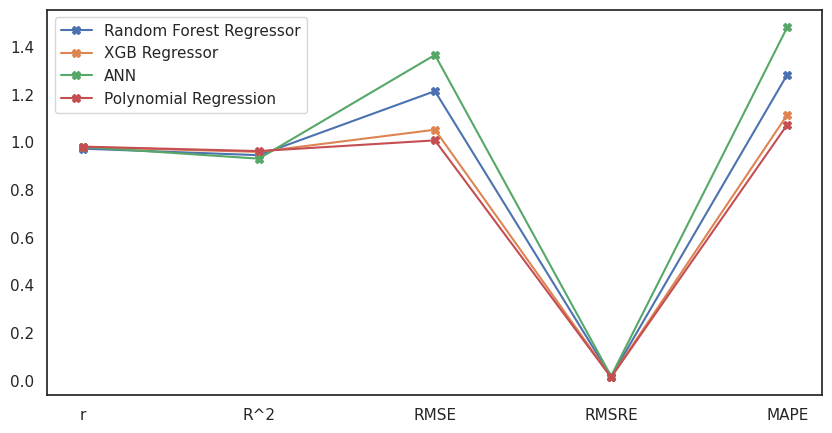

In [ ]:
plot.add(model_name='Polynomial Regression', y_test=val_y, y_pred=test_predsvr)
plot.show(figsize=(10, 5))

In [ ]:
svm_reg = SVR(kernel='rbf', C=1000000, epsilon=0.001)
svm_reg.fit(train_X, train_y)

test_predsvm = svm_reg.predict(val_X)
train_predsvm = svm_reg.predict(train_X)

print('Test set evaluation:')
print_evaluate(val_y, test_predsvm)

print('Train set evaluation:')
print_evaluate(train_y, train_predsvm)

results_df2 = pd.DataFrame(data=[["SVR", *evaluate(val_y, test_predsvm), 0]],
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])
results_df = pd.concat([results_df, results_df2], ignore_index=True)

Test set evaluation:
MAE: 0.8173001372722979
MSE: 1.0312033117057562
RMSE: 1.0154818125923064
R2 Square 0.961450498687308
__________________________________
Train set evaluation:
MAE: 0.8044093201840876
MSE: 1.0134990407609996
RMSE: 1.0067268948235164
R2 Square 0.9622127913890313
__________________________________


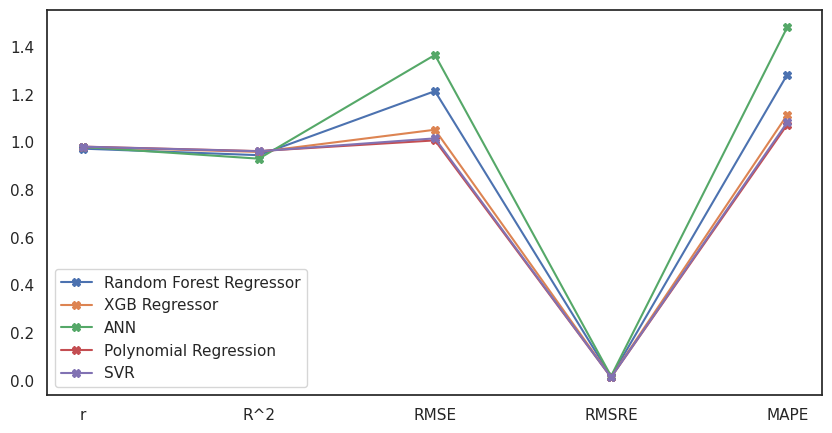

In [ ]:
plot.add(model_name='SVR', y_test=val_y, y_pred=test_predsvm)
plot.show(figsize=(10, 5))

<Axes: ylabel='Model'>

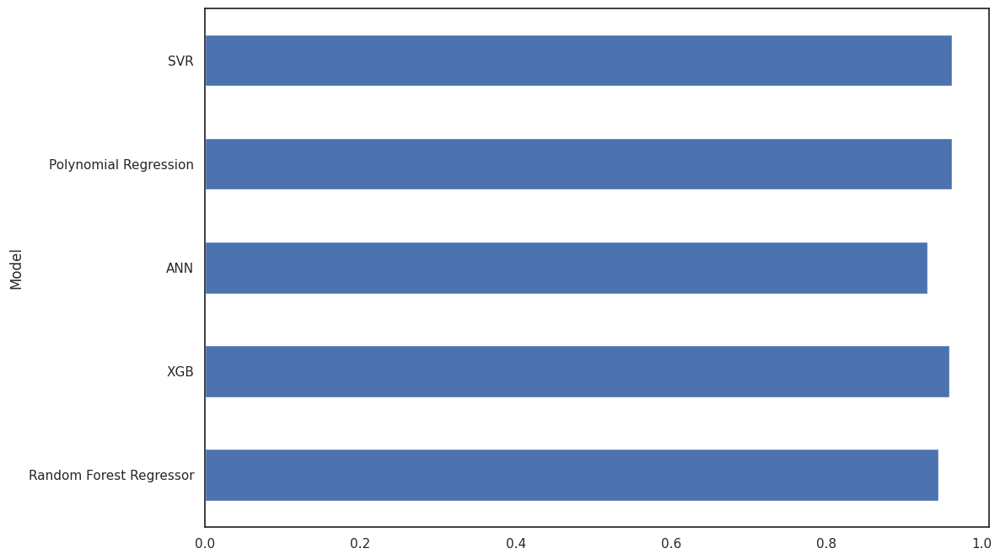

In [ ]:
results_df.set_index('Model', inplace=True)
results_df['R2 Square'].plot(kind='barh', figsize=(12, 8))

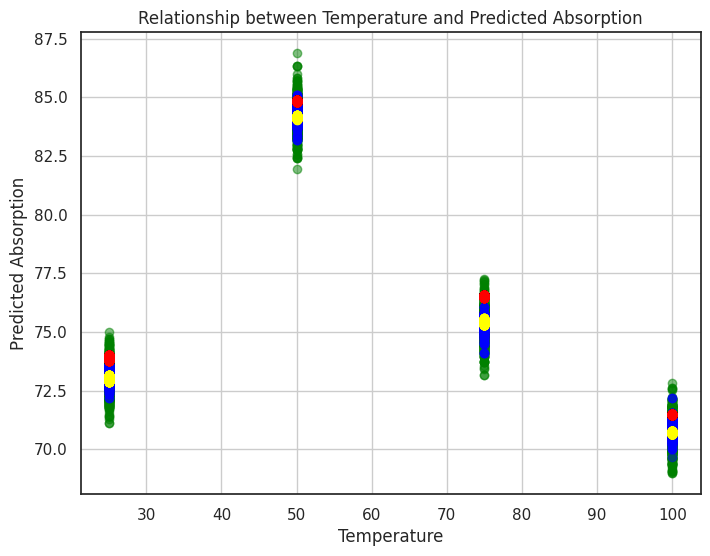

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(val_X['Temperature'], predicted_absorption, color='green', alpha=0.5)
plt.scatter(val_X['Temperature'], XGBpredictions, color='blue', alpha=0.4)
plt.scatter(val_X['Temperature'], test_predsvr, color='blue', alpha=0.5)
plt.scatter(val_X['Temperature'], test_predsvm, color='yellow', alpha=1)
plt.scatter(val_X['Temperature'], test_pred, color='red', alpha=0.5)

plt.xlabel('Temperature')
plt.ylabel('Predicted Absorption')
plt.title('Relationship between Temperature and Predicted Absorption')
plt.grid(True)
plt.show()

In [ ]:
# @title Classification and Prediciton of Water's Potability based on pH, Hardness, Solid, Sulfate, etc...

#columns_drop = ['Potability', 'Temperature', 'Absorption', 'MAC']
X = potability.drop('Potability',axis=1)
Y = potability['Potability']

In [ ]:
X, Y

(            ph    Hardness        Solids  Chloramines     Sulfate  \
 0     7.080795  204.890455  20791.318981     7.300212  368.516441   
 1     3.716080  129.422921  18630.057858     6.635246  333.775777   
 2     8.099124  224.236259  19909.541732     9.275884  333.775777   
 3     8.316766  214.373394  22018.417441     8.059332  356.886136   
 4     9.092223  181.101509  17978.986339     6.546600  310.135738   
 ...        ...         ...           ...          ...         ...   
 3271  4.668102  193.681735  47580.991603     7.166639  359.948574   
 3272  7.808856  193.553212  17329.802160     8.061362  333.775777   
 3273  9.419510  175.762646  33155.578218     7.350233  333.775777   
 3274  5.126763  230.603758  11983.869376     6.303357  333.775777   
 3275  7.874671  195.102299  17404.177061     7.509306  333.775777   
 
       Conductivity  Organic_carbon  Trihalomethanes  Turbidity  
 0       564.308654       10.379783        86.990970   2.963135  
 1       592.885359       

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

In [ ]:
X_train, Y_test, Y_train, Y_test

(            ph    Hardness        Solids  Chloramines     Sulfate  \
 1556  7.080795  158.207647  45243.028953     4.064878  247.180038   
 1362  8.143483  182.432457  10673.582674     6.607835  333.775777   
 2787  5.376078  185.540478  36026.401556     9.649943  343.486633   
 1134  7.535700  221.792481  14829.745971     6.701159  366.412200   
 1509  6.618187  164.254565  13776.621792     5.925462  333.775777   
 ...        ...         ...           ...          ...         ...   
 1095  4.187491  208.374188  21809.709834     5.846112  327.474203   
 1130  7.793915  164.958947  25506.912237     7.868036  358.259200   
 1294  6.630364  186.761088  30939.023214     7.703481  333.775777   
 860   8.783168  218.032840  16183.586649     7.390474  334.053885   
 3174  6.698154  198.286268  34675.862845     6.263602  360.232834   
 
       Conductivity  Organic_carbon  Trihalomethanes  Turbidity  
 1556    399.766965       16.086232        53.502086   4.108857  
 1362    427.545219       

In [ ]:
potability = DecisionTreeClassifier(criterion= 'gini', min_samples_split=8, splitter= 'random')

In [ ]:
potability.fit(X_train,Y_train)

DecisionTreeClassifier(min_samples_split=8, splitter='random')

In [ ]:
prediction=potability.predict(X_test)
accuracy_df=accuracy_score(Y_test,prediction)*100
accuracy_df

57.57855822550832

In [ ]:
print("Accuracy on training set: {:.3f}".format(potability.score(X_train, Y_train)))
print("Accuracy on test set: {:.3f}".format(potability.score(X_test, Y_test)))

Accuracy on training set: 0.868
Accuracy on test set: 0.576


In [ ]:
accuracy_score(prediction,Y_test)

0.5757855822550831

In [ ]:
print("Feature importances:\n{}".format(potability.feature_importances_))

Feature importances:
[0.16015882 0.12873266 0.11064218 0.1361671  0.15775129 0.06601031
 0.09675676 0.07516741 0.06861347]


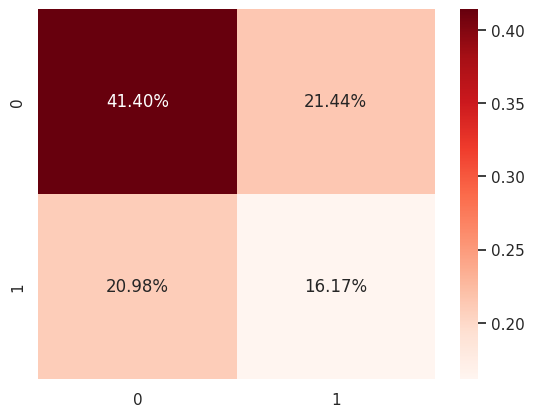

In [ ]:
confusion_matrix(prediction,Y_test)
cm1 = confusion_matrix(Y_test, prediction)
sns.heatmap(cm1/np.sum(cm1), annot = True, fmt=  '0.2%', cmap = 'Reds')
plt.show()

In [ ]:
knn=KNeighborsClassifier(metric= 'manhattan', n_neighbors= 26, weights= 'uniform')
knn.fit(X_train,Y_train)

KNeighborsClassifier(metric='manhattan', n_neighbors=26)

In [ ]:
prediction_knn=knn.predict(X_test)
accuracy_knn=accuracy_score(Y_test,prediction_knn)*100
print('accuracy_score score     : ',accuracy_score(Y_test,prediction_knn)*100,'%')

accuracy_score score     :  61.182994454713494 %


In [ ]:
print(classification_report(Y_test,prediction_knn))

              precision    recall  f1-score   support

           0       0.63      0.91      0.75       680
           1       0.42      0.11      0.18       402

    accuracy                           0.61      1082
   macro avg       0.53      0.51      0.46      1082
weighted avg       0.55      0.61      0.54      1082



In [ ]:
confusion_matrix(prediction,Y_test)

array([[448, 227],
       [232, 175]])

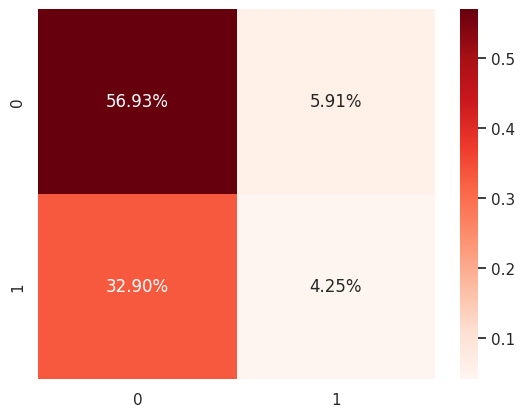

In [ ]:
cm2 = confusion_matrix(Y_test, prediction_knn)
sns.heatmap(cm2/np.sum(cm2), annot = True, fmt=  '0.2%', cmap = 'Reds')
plt.show()

In [ ]:
lg = LogisticRegression(max_iter=120,random_state=0, n_jobs=20)
lg.fit(X_train, Y_train)

LogisticRegression(max_iter=120, n_jobs=20, random_state=0)

In [ ]:
prediction_lg=lg.predict(X_test)
accuracy_lg=accuracy_score(Y_test,prediction_lg)*100
print('accuracy_score score     : ',accuracy_score(Y_test,prediction_lg)*100,'%')

accuracy_score score     :  62.84658040665434 %


In [ ]:
print(classification_report(Y_test,prediction_lg))

              precision    recall  f1-score   support

           0       0.63      1.00      0.77       680
           1       0.00      0.00      0.00       402

    accuracy                           0.63      1082
   macro avg       0.31      0.50      0.39      1082
weighted avg       0.39      0.63      0.49      1082



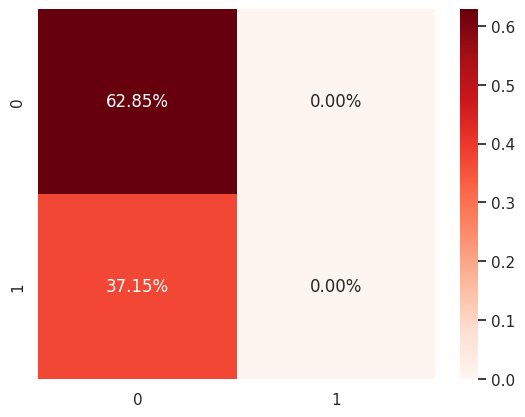

In [ ]:
cm24 = confusion_matrix(Y_test, prediction_lg)
sns.heatmap(cm24/np.sum(cm24), annot = True, fmt=  '0.2%', cmap = 'Reds')
plt.show()

In [ ]:
rf = RandomForestClassifier(n_estimators=300,min_samples_leaf=0.16, random_state=42)

In [ ]:
rf.fit(X_train, Y_train)

RandomForestClassifier(min_samples_leaf=0.16, n_estimators=300, random_state=42)

In [ ]:
prediction_rf=rf.predict(X_test)
accuracy_rf=accuracy_score(Y_test,prediction_rf)*100
print('accuracy_score score     : ',accuracy_score(Y_test,prediction_rf)*100,'%')

accuracy_score score     :  62.84658040665434 %


In [ ]:
print(classification_report(Y_test,prediction_rf))

              precision    recall  f1-score   support

           0       0.63      1.00      0.77       680
           1       0.00      0.00      0.00       402

    accuracy                           0.63      1082
   macro avg       0.31      0.50      0.39      1082
weighted avg       0.39      0.63      0.49      1082



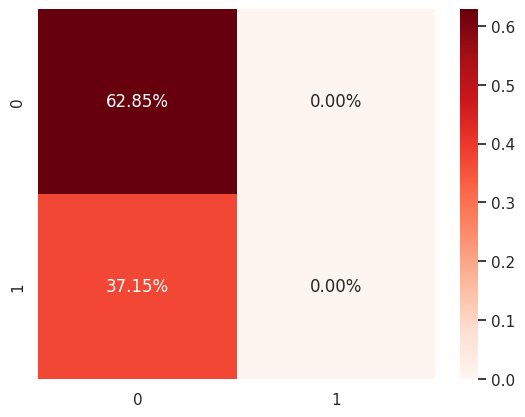

In [ ]:
cm3 = confusion_matrix(Y_test, prediction_rf)
sns.heatmap(cm3/np.sum(cm3), annot = True, fmt=  '0.2%', cmap = 'Reds')
plt.show()

In [ ]:
gnb = GaussianNB()
gnb.fit(X_train, Y_train)

GaussianNB()

In [ ]:
prediction_gnb=gnb.predict(X_test)
accuracy_gnb=accuracy_score(Y_test,prediction_gnb)*100
print('accuracy_score score     : ',accuracy_score(Y_test,prediction_gnb)*100,'%')

accuracy_score score     :  63.86321626617375 %


In [ ]:
print(classification_report(Y_test,prediction_gnb))

              precision    recall  f1-score   support

           0       0.66      0.89      0.76       680
           1       0.53      0.22      0.31       402

    accuracy                           0.64      1082
   macro avg       0.60      0.55      0.53      1082
weighted avg       0.61      0.64      0.59      1082



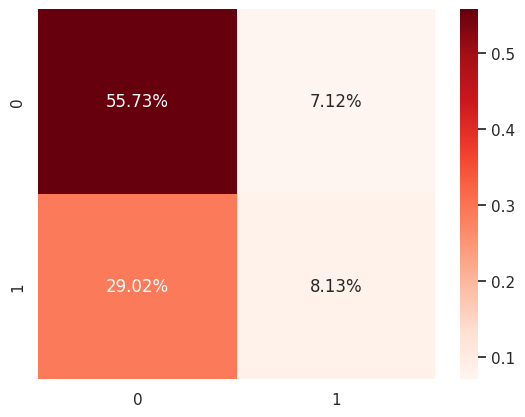

In [ ]:
cm8 = confusion_matrix(Y_test, prediction_gnb)
sns.heatmap(cm8/np.sum(cm8), annot = True, fmt=  '0.2%', cmap = 'Reds')
plt.show()

In [ ]:
xgb = XGBClassifier(max_depth= 8, n_estimators= 125, random_state= 0,  learning_rate= 0.04, n_jobs=5)
xgb.fit(X_train, Y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.04, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=125, n_jobs=5,
              num_parallel_tree=None, random_state=0, ...)

In [ ]:
prediction_xgb = xgb.predict(X_test)

In [ ]:
accuracy_xgb=accuracy_score(Y_test,prediction_xgb)*100
print('accuracy_score score     : ',accuracy_score(Y_test,prediction_xgb)*100,'%')

accuracy_score score     :  66.91312384473198 %


In [ ]:
print(classification_report(Y_test,prediction_xgb))

              precision    recall  f1-score   support

           0       0.69      0.86      0.77       680
           1       0.60      0.34      0.43       402

    accuracy                           0.67      1082
   macro avg       0.64      0.60      0.60      1082
weighted avg       0.65      0.67      0.64      1082



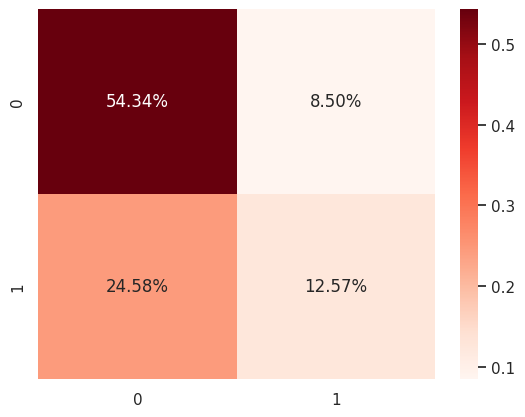

In [ ]:
cm4 = confusion_matrix(Y_test, prediction_xgb)
sns.heatmap(cm4/np.sum(cm4), annot = True, fmt=  '0.2%', cmap = 'Reds')
plt.show()

In [ ]:
svm = SVC(kernel='rbf', random_state = 42)
svm.fit(X_train, Y_train)

SVC(random_state=42)

In [ ]:
prediction_svm = svm.predict(X_test)

In [ ]:
accuracy_svm=accuracy_score(Y_test,prediction_svm)*100
print('accuracy_score score     : ',accuracy_score(Y_test,prediction_svm)*100,'%')

accuracy_score score     :  62.84658040665434 %


In [ ]:
print(classification_report(Y_test,prediction_svm))

              precision    recall  f1-score   support

           0       0.63      1.00      0.77       680
           1       0.00      0.00      0.00       402

    accuracy                           0.63      1082
   macro avg       0.31      0.50      0.39      1082
weighted avg       0.39      0.63      0.49      1082



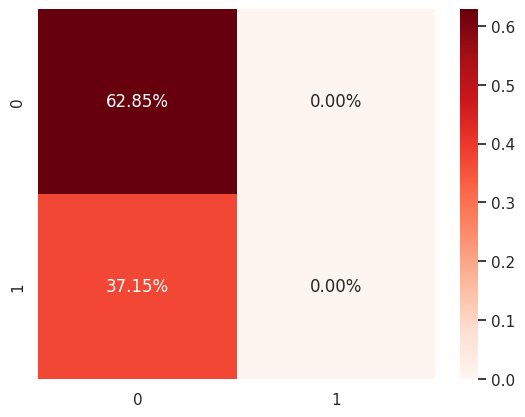

In [ ]:
cm6 = confusion_matrix(Y_test, prediction_svm)
sns.heatmap(cm6/np.sum(cm6), annot = True, fmt=  '0.2%', cmap = 'Reds')
plt.show()

In [ ]:
ada = AdaBoostClassifier(learning_rate= 0.05,n_estimators= 205,random_state=42)
ada.fit(X_train, Y_train)

AdaBoostClassifier(learning_rate=0.05, n_estimators=205, random_state=42)

In [ ]:
prediction_ada = ada.predict(X_test)

In [ ]:
accuracy_ada=accuracy_score(Y_test,prediction_ada)*100
print('accuracy_score score     : ',accuracy_score(Y_test,prediction_ada)*100,'%')

accuracy_score score     :  63.03142329020333 %


In [ ]:
print(classification_report(Y_test,prediction_ada))

              precision    recall  f1-score   support

           0       0.64      0.96      0.76       680
           1       0.52      0.08      0.14       402

    accuracy                           0.63      1082
   macro avg       0.58      0.52      0.45      1082
weighted avg       0.59      0.63      0.53      1082



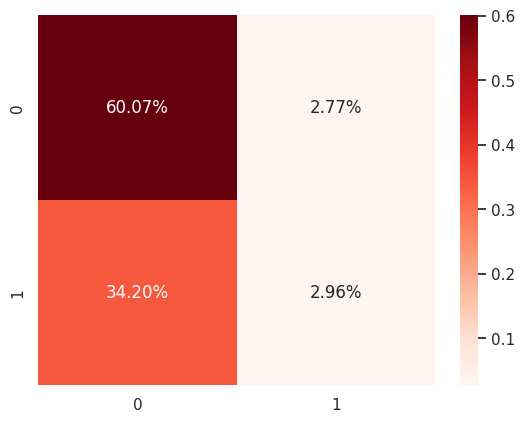

In [ ]:
cm7 = confusion_matrix(Y_test, prediction_ada)
sns.heatmap(cm7/np.sum(cm7), annot = True, fmt=  '0.2%', cmap = 'Reds')
plt.show()

,Model,Accuracy_score
0,Decision Tree,57.578558
1,KNN,61.182994
2,Logistic Regression,62.846580
3,Random Forest,62.846580
6,SVM,62.846580
7,AdaBoost,63.031423
5,Gaussian Naive Bayes,63.863216
4,XGBoost Classifier,66.913124


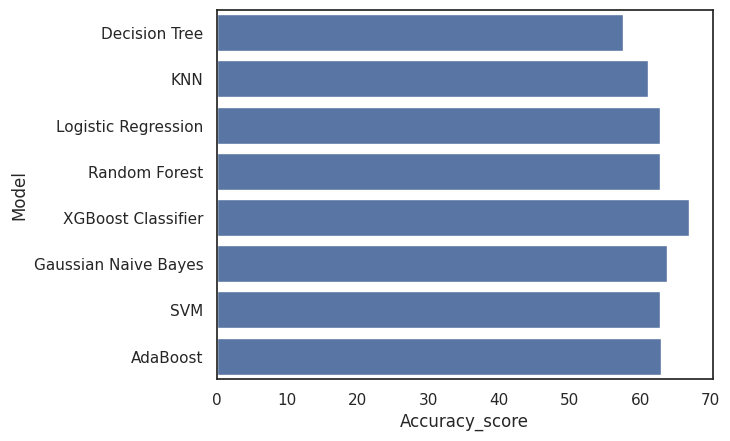

In [ ]:
models = pd.DataFrame({
    'Model':['Decision Tree', 'KNN', 'Logistic Regression', 'Random Forest','XGBoost Classifier','Gaussian Naive Bayes' ,'SVM', 'AdaBoost'],
    'Accuracy_score' :[accuracy_df,accuracy_knn,accuracy_lg, accuracy_rf, accuracy_xgb,accuracy_gnb, accuracy_svm, accuracy_ada]
})

sns.barplot(x='Accuracy_score', y='Model', data=models)

models.sort_values(by='Accuracy_score', ascending=True)